# Gas Prices

In [6]:
import pandas as pd
import plotly.express as px
import re

Load raw data from the
[US Engergy Information Administration](https://www.eia.gov/petroleum/gasdiesel/).

* The `header` parameter skips some irrelevant rows at the top.
* We parse the `Date` column into actual Pandas date-time objects.
* Rather than using a numeric index, use the `Date` column as the index. Note that the `Date` column is the first (zero-th) column
  and we refer to it as such with `index_col=0`.

In [7]:
regular_gas = pd.read_csv("regular-conventional.csv", header=[2], parse_dates=['Date'], index_col=0)
regular_gas

,Weekly U.S. Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly East Coast Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly New England (PADD 1A) Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Central Atlantic (PADD 1B) Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Lower Atlantic (PADD 1C) Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Midwest Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Gulf Coast Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Rocky Mountain Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly West Coast Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Colorado Regular Conventional Retail Gasoline Prices (Dollars per Gallon),...,Weekly New York Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Minnesota Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Ohio Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Texas Regular Conventional Retail Gasoline Prices (Dollars per Gallon),Weekly Washington Regular Conventional Retail Gasoline Prices (Dollars per Gallon),"Weekly Cleveland, OH Regular Conventional Retail Gasoline Prices (Dollars per Gallon)","Weekly Denver, CO Regular Conventional Retail Gasoline Prices (Dollars per Gallon)","Weekly Miami, FL Regular Conventional Retail Gasoline Prices (Dollars per Gallon)","Weekly Seattle, WA Regular Conventional Retail Gasoline Prices (Dollars per Gallon)",Unnamed: 21
Date,,,,,,,,,,,,,,,,,,,,,
1990-08-20,1.191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-08-27,1.245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-09-03,1.242,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-09-10,1.252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-09-17,1.266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,3.330,3.366,3.484,3.599,3.294,3.254,3.133,3.331,3.830,3.274,...,3.592,3.280,3.273,3.090,3.855,3.287,3.216,3.431,4.029,NaN
2022-02-14,3.372,3.418,3.520,3.674,3.339,3.284,3.211,3.329,3.838,3.283,...,3.674,3.306,3.238,3.162,3.857,3.272,3.249,3.408,4.028,NaN
2022-02-21,3.410,3.470,3.586,3.726,3.390,3.315,3.241,3.344,3.875,3.289,...,3.729,3.388,3.377,3.175,3.870,3.366,3.261,3.483,4.055,NaN


* Simplify the column headers.
* `replace` does a simple string replacement.
* `re.sub` uses regular expressions to remove more complex text from each header.

In [8]:
def simplify_header(header):
    header = header.replace('Weekly ', '')
    header = re.sub(r' Regular Conventional.*', '', header)
    header = re.sub(r'\(PADD 1.\)', '', header)
    header = re.sub(r', [A-Z]{2}', '', header)
    return header
    
# Apply `simplify_header` to each of the headers in the "columns" axis.
regular = regular_gas.rename(simplify_header, axis='columns')

regular = regular.drop('Unnamed: 21', axis=1)
regular

,U.S.,East Coast,New England,Central Atlantic,Lower Atlantic,Midwest,Gulf Coast,Rocky Mountain,West Coast,Colorado,Florida,New York,Minnesota,Ohio,Texas,Washington,Cleveland,Denver,Miami,Seattle
Date,,,,,,,,,,,,,,,,,,,,
1990-08-20,1.191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-08-27,1.245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-09-03,1.242,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-09-10,1.252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-09-17,1.266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,3.330,3.366,3.484,3.599,3.294,3.254,3.133,3.331,3.830,3.274,3.420,3.592,3.280,3.273,3.090,3.855,3.287,3.216,3.431,4.029
2022-02-14,3.372,3.418,3.520,3.674,3.339,3.284,3.211,3.329,3.838,3.283,3.404,3.674,3.306,3.238,3.162,3.857,3.272,3.249,3.408,4.028
2022-02-21,3.410,3.470,3.586,3.726,3.390,3.315,3.241,3.344,3.875,3.289,3.457,3.729,3.388,3.377,3.175,3.870,3.366,3.261,3.483,4.055


In [9]:
regular.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1647 entries, 1990-08-20 to 2022-03-07
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   U.S.               1641 non-null   float64
 1   East Coast         1557 non-null   float64
 2   New England        1510 non-null   float64
 3   Central Atlantic   1510 non-null   float64
 4   Lower Atlantic     1510 non-null   float64
 5   Midwest            1557 non-null   float64
 6   Gulf Coast         1557 non-null   float64
 7   Rocky Mountain     1557 non-null   float64
 8   West Coast         1552 non-null   float64
 9   Colorado           1136 non-null   float64
 10  Florida            981 non-null    float64
 11  New York           1136 non-null   float64
 12  Minnesota          1136 non-null   float64
 13  Ohio               981 non-null    float64
 14  Texas              1136 non-null   float64
 15  Washington         981 non-null    float64
 16  Clevel

* Show just the national data.

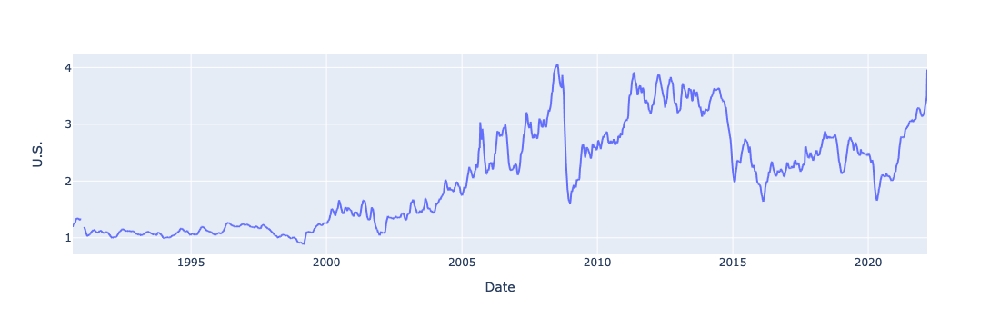

In [10]:
px.line(regular, y='U.S.')

Without a specific selection of y-axis, display all the numeric columns.
The index (containing Pandas dates) is automatically used for the x-axis.

This isn't a very helpful chart because all the data overlay one another.
Plotly provides some extra functionality to improve the situation:
* Double click on a label in the legend to focus on just one column.
* Single click to add additional columns for comparison.

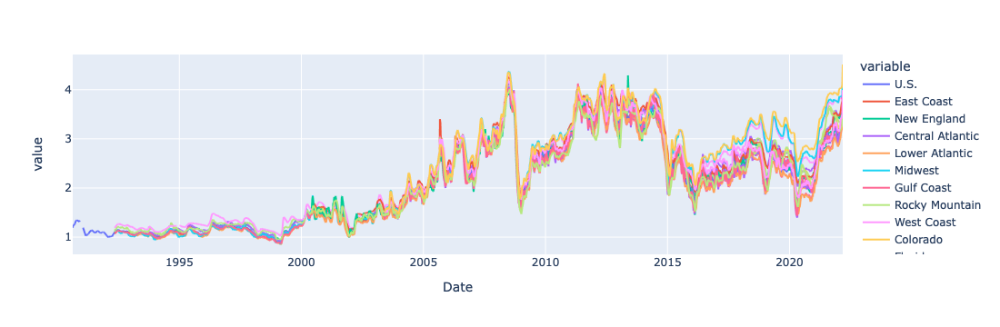

In [11]:
px.line(regular)

## Tall vs Wide Data

The gas price data we've seen so far is referred to informally as "**wide**" data.
A characteristic of wide data is that each column represents a different "sample" or "data point."
This format often feels natural for use by people,
but is generally less flexible when used in data science.
Instead, we often prefer "**tall**" data,
which usually has fewer columns and in which each row
represents a single sample.

Pandas can convert from wide to tall data with the `melt` function.
(The inverse operation is implemented by the `pivot` function,
which is similar to what you may have encountered in a spreadsheet _pivot table_.)
The `melt` functon "melts" the data such that it "runs down" the page.

In [12]:
melted = regular.melt(ignore_index=False)
melted

,variable,value
Date,,
1990-08-20,U.S.,1.191
1990-08-27,U.S.,1.245
1990-09-03,U.S.,1.242
1990-09-10,U.S.,1.252
1990-09-17,U.S.,1.266
...,...,...
2022-02-07,Seattle,4.029
2022-02-14,Seattle,4.028
2022-02-21,Seattle,4.055


Tall data tends to be more flexible, but we can generate the same visualizations as with wide data.
Here's an example.
Note that we had to specify `color` as depending on the `variable` column of the `melted` DataFrame
in order to get Plotly to create one line per unique value that column.

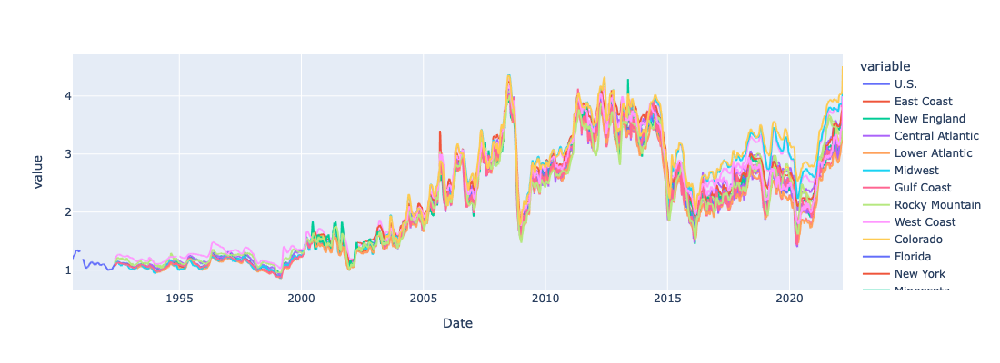

In [15]:
px.line(melted, y='value', color='variable', height=400)

## State Data

We can extract select columns from the original DataFrame
in order to produce a chart containing a subset of the original data.
Here's how we'd pick out the columns from the original data that correspond to individual states in the data.

In [85]:
states = regular[['Colorado', 'Florida', 'New York', 'Minnesota', 'Ohio', 'Texas', 'Washington']].dropna()
states

,Colorado,Florida,New York,Minnesota,Ohio,Texas,Washington
Date,,,,,,,
2003-05-26,1.477,1.439,1.555,1.457,1.421,1.360,1.543
2003-06-02,1.455,1.443,1.534,1.435,1.365,1.356,1.539
2003-06-09,1.444,1.449,1.524,1.466,1.487,1.363,1.541
2003-06-16,1.496,1.478,1.523,1.511,1.515,1.386,1.582
2003-06-23,1.490,1.468,1.508,1.442,1.391,1.382,1.586
...,...,...,...,...,...,...,...
2022-02-07,3.274,3.420,3.592,3.280,3.273,3.090,3.855
2022-02-14,3.283,3.404,3.674,3.306,3.238,3.162,3.857
2022-02-21,3.289,3.457,3.729,3.388,3.377,3.175,3.870


The resulting chart is less cluttered, but still pretty hard to understand.
This chart allows you to use the same mouse actions as mentioned above to help focus on particular locations.

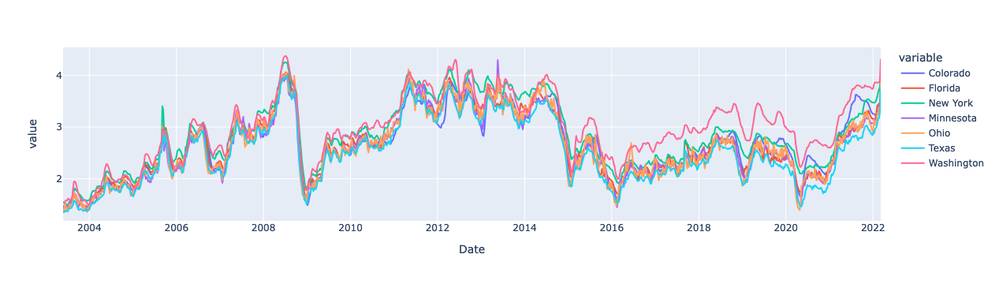

In [86]:
px.line(states)

We can illustrate some other plotting options by converting this wide state data into a tall format.

In [87]:
states_melt = states.melt(ignore_index=False, var_name='State', value_name='Price')
states_melt

,State,Price
Date,,
2003-05-26,Colorado,1.477
2003-06-02,Colorado,1.455
2003-06-09,Colorado,1.444
2003-06-16,Colorado,1.496
2003-06-23,Colorado,1.490
...,...,...
2022-02-07,Washington,3.855
2022-02-14,Washington,3.857
2022-02-21,Washington,3.870


Similar to how we used the state for the `color` aesthetic earlier,
we can, instead, use the color for the `facet` aesthetic,
which is how Plotly refers to a "small multiples" visualization.

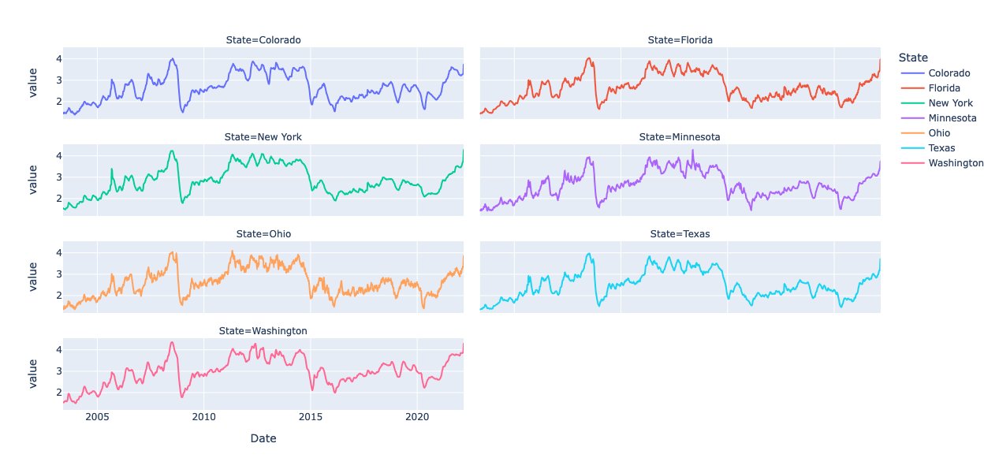

In [88]:
px.line(states_melt, facet_col='State', facet_col_wrap=2, color="State", height=600)

## Merge Multiple Datasets

The previous U.S. data extends from the present day back to 1990. 
Let's grab data from earlier in the twentieth century.

In [131]:
since_1929 = pd.read_csv("since-1929.csv", parse_dates=[0], index_col=0, usecols=['Year', 'Current Dollars'])
since_1929

,Current Dollars
Year,
1929-01-01,0.21
1930-01-01,0.20
1931-01-01,0.17
1932-01-01,0.18
1933-01-01,0.18
...,...
2011-01-01,3.53
2012-01-01,3.64
2013-01-01,3.53


* Coerce this DataFrame to using consistent names.

In [134]:
since_1929 = since_1929.rename({ 'Current Dollars': 'Price' }, axis=1)
since_1929.index.name = 'Date'
since_1929

,Price
Date,
1929-01-01,0.21
1930-01-01,0.20
1931-01-01,0.17
1932-01-01,0.18
1933-01-01,0.18
...,...
2011-01-01,3.53
2012-01-01,3.64
2013-01-01,3.53


* Visualize these data.

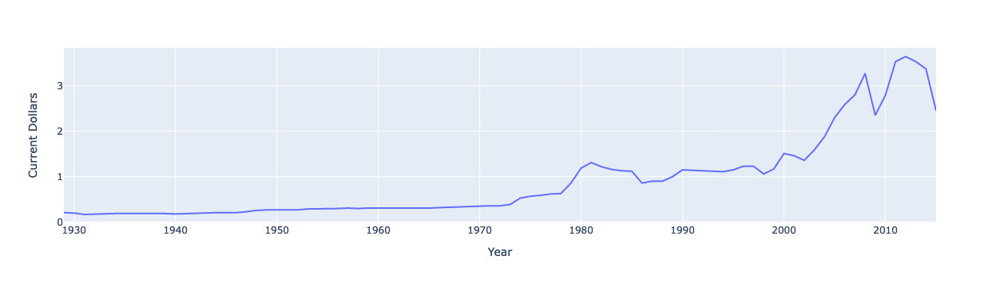

In [108]:
px.line(since_1929, y='Current Dollars')

* Wrangle the U.S. data from the EIA into the same form as the `since_1929` data set.

In [149]:
recent_us = pd.DataFrame(regular['U.S.']).rename({ 'U.S.': 'Price' }, axis=1)
recent_us

,Price
Date,
1990-08-20,1.191
1990-08-27,1.245
1990-09-03,1.242
1990-09-10,1.252
1990-09-17,1.266
...,...
2022-02-07,3.330
2022-02-14,3.372
2022-02-21,3.410


* Concatenate these two data sets to get the widest range of prices available. Because index and column names match, this works swimmingly.
* Sort the resulting index so we get everything in chronological order.
* Drop missing values.

In [155]:
regular_all = pd.concat([since_1929, recent_us]).sort_index().dropna()
regular_all

,Price
Date,
1929-01-01,0.210
1930-01-01,0.200
1931-01-01,0.170
1932-01-01,0.180
1933-01-01,0.180
...,...
2022-02-07,3.330
2022-02-14,3.372
2022-02-21,3.410


* Plot the result.
  Note that we get much more detailed data starting in 1990 becuase the more recent data are weekly instead of annual.

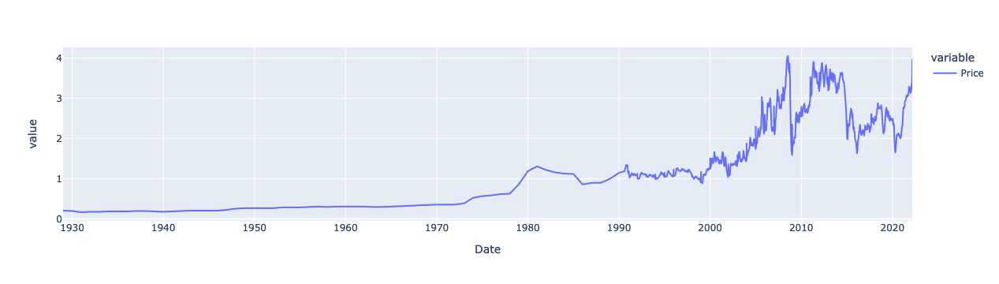

In [156]:
px.line(regular_all)

# Consumer Price Index (CPI)

The gas price data we've looked at so far is not adjusted for inflation.
Let's remedy that.

We'll use data from the [Bureau of Labor Statistics](https://data.bls.gov/timeseries/CUUR0000SA0?years_option=all_years).
Here's the raw data. There's lots of cleaning to do.

In [104]:
pd.read_csv("cpi-u.csv")

,CPI for All Urban Consumers (CPI-U),Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,Original Data Value,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Series Id:,CUUR0000SA0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Not Seasonally Adjusted,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Series Title:,"All items in U.S. city average, all urban cons...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,2018,247.867,248.991,249.554,250.546,251.588,251.989,252.006,252.146,252.439,252.885,252.038,251.233,250.089,252.125
117,2019,251.712,252.776,254.202,255.548,256.092,256.143,256.571,256.558,256.759,257.346,257.208,256.974,254.412,256.903
118,2020,257.971,258.678,258.115,256.389,256.394,257.797,259.101,259.918,260.280,260.388,260.229,260.474,257.557,260.065
119,2021,261.582,263.014,264.877,267.054,269.195,271.696,273.003,273.567,274.310,276.589,277.948,278.802,266.236,275.703


* Remove a bunch of rows at the top to get to the "real" headers at row offset 11. 
* Toss the "HALF" columns on the right.

In [91]:
cpi_raw = pd.read_csv("cpi-u.csv", header=[11]).drop(columns=['HALF1', 'HALF2'])
cpi_raw

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,1913,9.800,9.800,9.800,9.800,9.700,9.800,9.900,9.900,10.000,10.000,10.100,10.000
1,1914,10.000,9.900,9.900,9.800,9.900,9.900,10.000,10.200,10.200,10.100,10.200,10.100
2,1915,10.100,10.000,9.900,10.000,10.100,10.100,10.100,10.100,10.100,10.200,10.300,10.300
3,1916,10.400,10.400,10.500,10.600,10.700,10.800,10.800,10.900,11.100,11.300,11.500,11.600
4,1917,11.700,12.000,12.000,12.600,12.800,13.000,12.800,13.000,13.300,13.500,13.500,13.700
...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,2018,247.867,248.991,249.554,250.546,251.588,251.989,252.006,252.146,252.439,252.885,252.038,251.233
106,2019,251.712,252.776,254.202,255.548,256.092,256.143,256.571,256.558,256.759,257.346,257.208,256.974
107,2020,257.971,258.678,258.115,256.389,256.394,257.797,259.101,259.918,260.280,260.388,260.229,260.474
108,2021,261.582,263.014,264.877,267.054,269.195,271.696,273.003,273.567,274.310,276.589,277.948,278.802


* "Melt" (a.k.a. "unpivot") the data from wide format to long format.
* Give the new columns sensible names.

In [92]:
cpi_raw = cpi_raw.melt(id_vars=['Year'], var_name='Month', value_name='CPI')
cpi_raw

,Year,Month,CPI
0,1913,Jan,9.800
1,1914,Jan,10.000
2,1915,Jan,10.100
3,1916,Jan,10.400
4,1917,Jan,11.700
...,...,...,...
1315,2018,Dec,251.233
1316,2019,Dec,256.974
1317,2020,Dec,260.474
1318,2021,Dec,278.802


* Create a new column containing bona fide Pandas date objects.
  Note how type conversion and string concatenation is applied to all rows of the DataFrame.

In [93]:
cpi_raw['Date'] = pd.to_datetime(cpi_raw['Year'].astype(str) + '-' + cpi_raw['Month'])
cpi_raw

,Year,Month,CPI,Date
0,1913,Jan,9.800,1913-01-01
1,1914,Jan,10.000,1914-01-01
2,1915,Jan,10.100,1915-01-01
3,1916,Jan,10.400,1916-01-01
4,1917,Jan,11.700,1917-01-01
...,...,...,...,...
1315,2018,Dec,251.233,2018-12-01
1316,2019,Dec,256.974,2019-12-01
1317,2020,Dec,260.474,2020-12-01
1318,2021,Dec,278.802,2021-12-01


* Set the index to be the newly created `Date` column. 
* Sort the index. Because it's a `Date` index, it will be sorted chronologically.

In [94]:
cpi_raw = cpi_raw.set_index('Date').sort_index()
cpi_raw

,Year,Month,CPI
Date,,,
1913-01-01,1913,Jan,9.8
1913-02-01,1913,Feb,9.8
1913-03-01,1913,Mar,9.8
1913-04-01,1913,Apr,9.8
1913-05-01,1913,May,9.7
...,...,...,...
2022-08-01,2022,Aug,NaN
2022-09-01,2022,Sep,NaN
2022-10-01,2022,Oct,NaN


* Drop the redundant `Year` and `Month` columns.

In [101]:
cpi_raw = cpi_raw.drop(['Year', 'Month'], axis='columns')
cpi_raw

,CPI
Date,
1913-01-01,9.800
1913-02-01,9.800
1913-03-01,9.800
1913-04-01,9.800
1913-05-01,9.700
...,...
2021-10-01,276.589
2021-11-01,277.948
2021-12-01,278.802


* Drop `NaN` values, which are mostly future months of the current year.

In [105]:
cpi = cpi_raw.dropna()
cpi

,CPI
Date,
1913-01-01,9.800
1913-02-01,9.800
1913-03-01,9.800
1913-04-01,9.800
1913-05-01,9.700
...,...
2021-10-01,276.589
2021-11-01,277.948
2021-12-01,278.802


Plot the CPI data. 
Happily, our plot looks a lot like the plot 
at the [BLS web site](https://data.bls.gov/timeseries/CUUR0000SA0?years_option=all_years), 
which gives us some confidence that we've gotten it right.

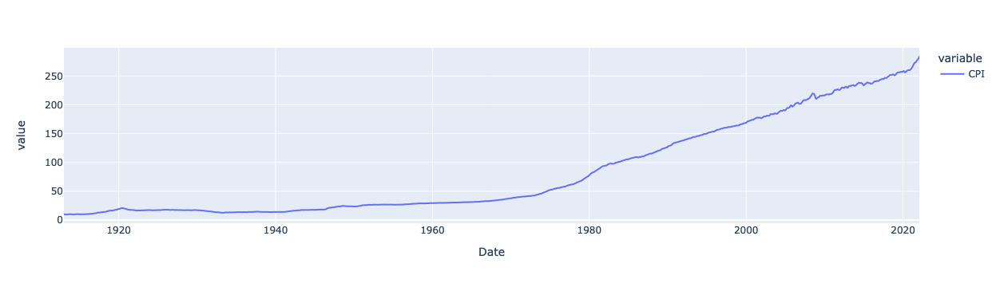

In [107]:
px.line(cpi)

# Inflation Adjusted Gas Prices

To calculate inflation-adjusted prices,
merged together the CPI and regular gas price data.
We'll do the merge on the index of these two DataFrames, which are both labeled `Date`.

Note that this merge operation will only keep rows where _both_ the `CPI` and `regular_gas`
DataFrames have values on the same date.
This results in the loss of a bunch of gas price data points.
The CPI data are only available on the first of each month,
so the only gas price data that survive are those that happen to be on the first of the month also.

A better strategy would be to interpolate values for the CPI to give meaningful values for all days of a month.
This would yield good values for _all_ of the gas prices.
However, for our purposes, this simpleminded strategy will suffice.

In [208]:
cpi_and_price = pd.merge(cpi, regular_all, on='Date')
cpi_and_price

,CPI,Price
Date,,
1929-01-01,17.100,0.210
1930-01-01,17.100,0.200
1931-01-01,15.900,0.170
1932-01-01,14.300,0.180
1933-01-01,12.900,0.180
...,...,...
2019-07-01,256.571,2.608
2020-06-01,257.797,1.883
2021-02-01,263.014,2.316


Calculate inflation-adjusted fuel prices relative to the CPI in 1929.
The expression in the divisor takes the `CPI` value for the earliest (zero-th) row in the data set.

In [203]:
in_1929_dollars = cpi_and_price['Price'] * cpi_and_price['CPI'] / cpi_and_price.iloc[0]['CPI']
in_1929_dollars

Date
1929-01-01     0.210000
1930-01-01     0.200000
1931-01-01     0.158070
1932-01-01     0.150526
1933-01-01     0.135789
                ...    
2019-07-01    39.130829
2020-06-01    28.387822
2021-02-01    35.622247
2021-03-01    40.660943
2021-11-01    53.314002
Length: 142, dtype: float64

Perform a similar calculation for the last value in the data set,
which is _almost_ in 2022.
(The last inflation adjusted gas price is for November 1, 2021 because that's the last date
for which both CPI and gas price data were available.
The `-1` in the denominator represents the last entry in the Series.
Think of it as "one from the end" of the series.

In [204]:
in_2022_dollars = cpi_and_price['Price'] * cpi_and_price['CPI'] / cpi_and_price.iloc[-1]['CPI']
in_2022_dollars

Date
1929-01-01    0.012920
1930-01-01    0.012304
1931-01-01    0.009725
1932-01-01    0.009261
1933-01-01    0.008354
                ...   
2019-07-01    2.407419
2020-06-01    1.746484
2021-02-01    2.191563
2021-03-01    2.501555
2021-11-01    3.280000
Length: 142, dtype: float64

Plot of gas prices in 1929 dollars.

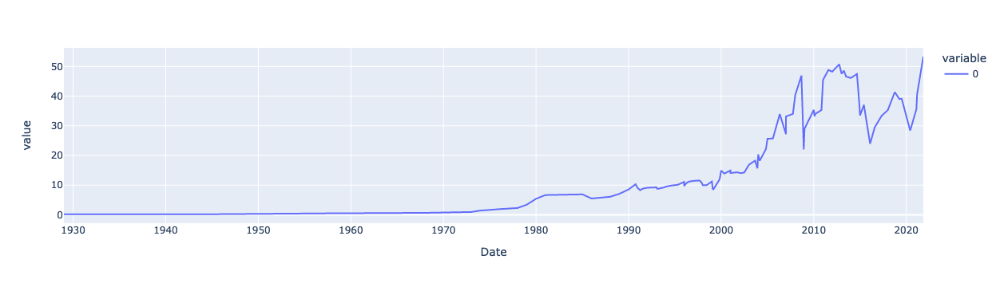

In [205]:
px.line(in_1929_dollars)

Plot of gas prices in late-2021 dollars. Inflation-adjusted gas from the 1930s was pretty much _free_!

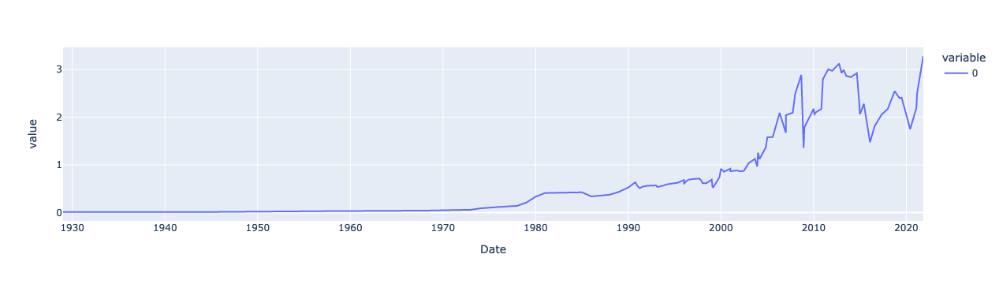

In [206]:
px.line(in_2022_dollars)

# Credits

* https://www.eia.gov/petroleum/gasdiesel/
* https://www.usinflationcalculator.com/inflation/historical-inflation-rates/
* https://www.energy.gov/eere/vehicles/fact-915-march-7-2016-average-historical-annual-gasoline-pump-price-1929-2015
* https://data.bls.gov/timeseries/CUUR0000SA0?years_option=all_years